#  Bouldering Analysis Notebook

 This notebook explores computer vision techniques to analyze climbing wall images. 
 The goal is to develop methods for automatically analyzing climbing wall layouts and routes.

 ## Basic Preprocessing
 
 The first step is to preprocess the images to make them easier to analyze:
 
 1. Convert to grayscale to focus on intensity values
 2. Apply noise reduction using Gaussian blur
 3. Detect edges using Canny edge detection
 4. Visualize the intermediate results at each step

 This preprocessing pipeline will help highlight key features like holds and wall structures
 while reducing noise and irrelevant details.


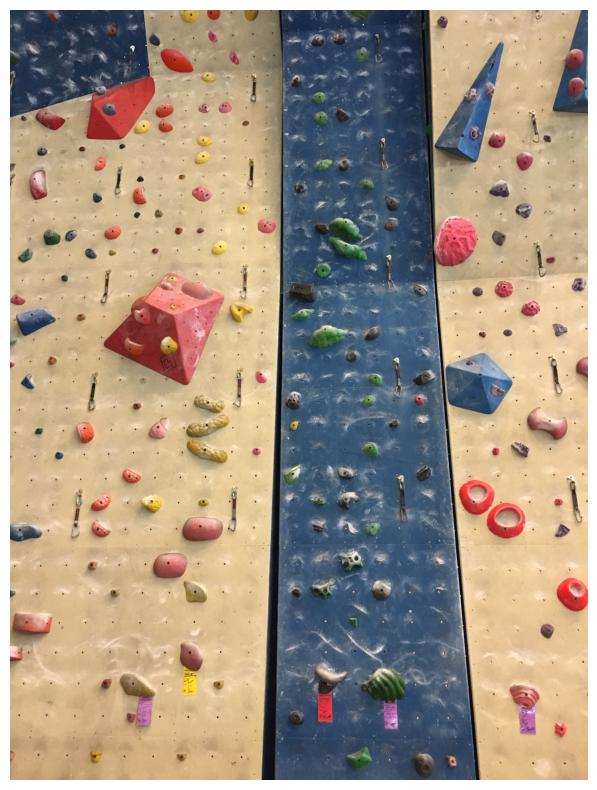

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Read the image
img_path = 'immagini test/IMG_001.JPG'
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Display the image
plt.figure(figsize=(15,10))
plt.imshow(img)
plt.axis('off')
plt.show()

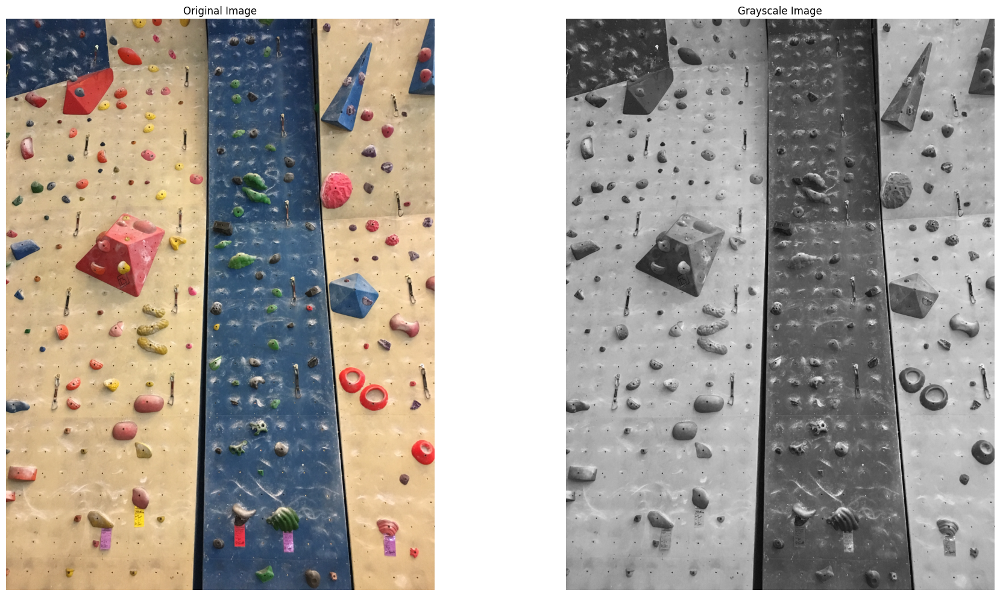

In [16]:
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Display original and grayscale images side by side
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Grayscale Image')
plt.imshow(gray, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

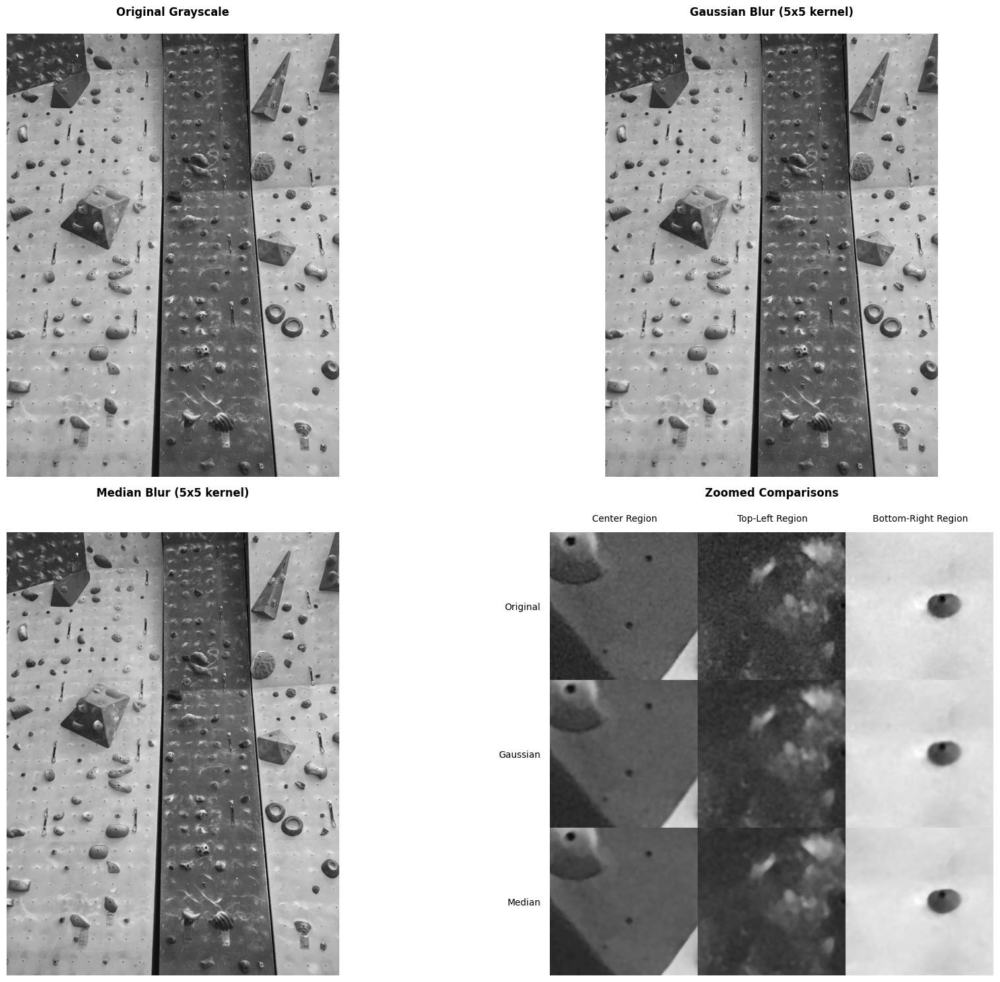

In [35]:
# Apply noise reduction
gaussian_blur = cv2.GaussianBlur(gray, ksize=(5,5), sigmaX=0)
median_blur = cv2.medianBlur(gray, ksize=5)

# Create figure with subplots
plt.figure(figsize=(20, 15))

# Main images comparison (first 3 subplots remain the same)
plt.subplot(2, 2, 1)
plt.title('Original Grayscale', fontsize=12, fontweight='bold', pad=20)
plt.imshow(gray, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Gaussian Blur (5x5 kernel)', fontsize=12, fontweight='bold', pad=20)
plt.imshow(gaussian_blur, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.title('Median Blur (5x5 kernel)', fontsize=12, fontweight='bold', pad=40)
plt.imshow(median_blur, cmap='gray')
plt.axis('off')

# Modified zoomed regions comparison
plt.subplot(2, 2, 4)
plt.title('Zoomed Comparisons', fontsize=12, fontweight='bold', pad=40)

# Define regions to zoom
zoom_regions = [
    (500, 500, 'Center Region'),
    (200, 200, 'Top-Left Region'),
    (800, 800, 'Bottom-Right Region')
]

# Create a composite image with regions side by side
zoom_size = 150
composite_width = zoom_size * 3  # 3 regions side by side
composite_height = zoom_size * 3  # Original + 2 blurs
composite = np.zeros((composite_height, composite_width))

for idx, (x, y, region_name) in enumerate(zoom_regions):
    # Extract regions
    original_zoom = gray[y:y+zoom_size, x:x+zoom_size]
    gaussian_zoom = gaussian_blur[y:y+zoom_size, x:x+zoom_size]
    median_zoom = median_blur[y:y+zoom_size, x:x+zoom_size]
    
    # Place regions side by side
    start_x = idx * zoom_size
    composite[0:zoom_size, start_x:start_x+zoom_size] = original_zoom
    composite[zoom_size:2*zoom_size, start_x:start_x+zoom_size] = gaussian_zoom
    composite[2*zoom_size:3*zoom_size, start_x:start_x+zoom_size] = median_zoom
    
    # Add column labels
    plt.text(start_x + zoom_size//2, -10, region_name, 
             fontsize=10, ha='center', va='bottom')

# Add row labels
plt.text(-10, zoom_size//2, 'Original', 
         fontsize=10, ha='right', va='center')
plt.text(-10, zoom_size*1.5, 'Gaussian', 
         fontsize=10, ha='right', va='center')
plt.text(-10, zoom_size*2.5, 'Median', 
         fontsize=10, ha='right', va='center')

plt.imshow(composite, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

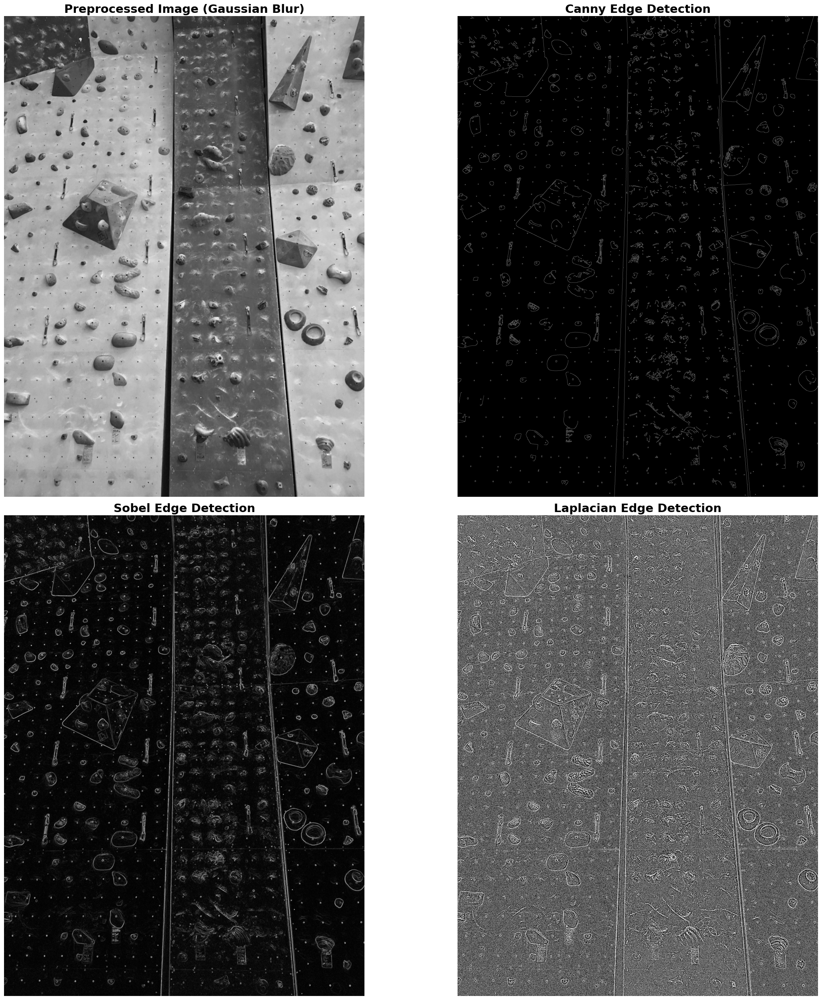

In [52]:
# Edge Detection Analysis
def detect_edges(image, method='canny', **kwargs):
    if method == 'canny':
        # Default values if not provided
        threshold1 = kwargs.get('threshold1', 100)
        threshold2 = kwargs.get('threshold2', 200)
        return cv2.Canny(image, threshold1, threshold2)
    elif method == 'sobel':
        # Compute gradients in x and y directions
        sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
        # Combine gradients
        return np.uint8(np.sqrt(sobelx**2 + sobely**2))
    elif method == 'laplacian':
        return cv2.Laplacian(image, cv2.CV_64F).astype(np.uint8)

# Apply different edge detection methods
canny_edges = detect_edges(gaussian_blur, 'canny', threshold1=50, threshold2=150)
sobel_edges = detect_edges(gaussian_blur, 'sobel')
laplacian_edges = detect_edges(gaussian_blur, 'laplacian')

# Create figure for comparison
plt.figure(figsize=(25, 25))

# Original grayscale
plt.subplot(2, 2, 1)
plt.title('Preprocessed Image (Gaussian Blur)', fontsize=21, fontweight='bold')
plt.imshow(gaussian_blur, cmap='gray')
plt.axis('off')

# Canny edges
plt.subplot(2, 2, 2)
plt.title('Canny Edge Detection', fontsize=21, fontweight='bold')
plt.imshow(canny_edges, cmap='gray')
plt.axis('off')

# Sobel edges
plt.subplot(2, 2, 3)
plt.title('Sobel Edge Detection', fontsize=21, fontweight='bold')
plt.imshow(sobel_edges, cmap='gray')
plt.axis('off')

# Laplacian edges
plt.subplot(2, 2, 4)
plt.title('Laplacian Edge Detection', fontsize=21, fontweight='bold')
plt.imshow(laplacian_edges, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

In [62]:
# Interactive Canny threshold adjustment
from ipywidgets import interact, IntSlider, Layout

@interact(
    threshold1=IntSlider(min=0, max=255, step=5, value=50, description='Lower Threshold:', 
                        layout=Layout(width='80%', margin='0 auto'),
                        style={'description_width': '120px'}),
    threshold2=IntSlider(min=0, max=255, step=5, value=150, description='Upper Threshold:',
                        layout=Layout(width='80%', margin='0 auto'),
                        style={'description_width': '120px'})
)
def update_canny(threshold1, threshold2):
    edges = cv2.Canny(gaussian_blur, threshold1, threshold2)
    plt.figure(figsize=(16, 12))
    
    plt.subplot(1, 2, 1)
    plt.title('Original (Gaussian Blur)', fontsize=16, fontweight='bold')
    plt.imshow(gaussian_blur, cmap='gray')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.title(f'Canny Edges (T1={threshold1}, T2={threshold2})', fontsize=16, fontweight='bold')
    plt.imshow(edges, cmap='gray')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

interactive(children=(IntSlider(value=50, description='Lower Threshold:', layout=Layout(margin='0 auto', width…